# Automated Road Segmentation for Change Detection in Cologne

Growing amounts of earth observation (EO) data may be used to monitor the earth’s surface and identify potential changes for various application domains. Through growingly accessible computing power and frameworks, deep learning has emerged as a promising approach to automatically extract information from images. This project combines EO data analysis with deep learning to highlight changes in the city of Cologne’s road network between the years 1998 and 2019. Automating manually time-consuming mapping tasks like road segmentation has great potential to improve work efficiency and resource allocation. A U-Net architecture-based convolutional neural network is used to identify roads in areal images from the two years. The generated road maps are then compared to detect changes between the years. Due to the lack of available datasets for the study area, an aerial image road dataset of Massachusetts is used to train the deep learning model. The model interacts with the imagery data in a Python environment and is built using the TensorFlow framework. The results successfully show major changes in the road network. However, future research is needed to further improve the quality of the segmented road maps. The low time and effort required to generate road segmentations using the proposed approach may make it well-suited for time-sensitive mapping tasks. Future improvement of the methodology could enable usage for disaster response mapping or precise mapping of newly developing areas that lack road data. This interdisciplinary project has applications in urbanization, image understanding, and change detection. It contributes to the growing field of earth observation and deep learning.


# Code

The GitHub MobileNetV2 implementations by [Raj (2020)](https://github.com/HrishantRaj/Building-Detection-using-U-Net-and-MobileNetV2) and [Tomar (2020)](https://github.com/nikhilroxtomar/Unet-with-Pretrained-Encoder/blob/master/U-Net_with_Pretrained_MobileNetV2_as_Encoder.ipynb) were used as starting points for creating the deep learning workflow. All code and pre-trained model are available on [GitLab](https://git.sbg.ac.at/st22_512323/i3-project-st23-dawuda).


## Set up the Environment

In [ ]:
# Mount Google Drive to access data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Replace this path to the working directory
os.chdir('/content/drive/My Drive/Datasets/')
os.getcwd()

'/content/drive/My Drive/Datasets'

In [ ]:
# Check if GPU is recognized
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Import dependencies
import os
import numpy as np
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras.layers import Conv2D, Activation, BatchNormalization, MaxPooling2D, Dropout, concatenate
from keras.layers import UpSampling2D, Input, Concatenate
from keras.models import Model , load_model
from keras.applications import MobileNetV2
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

from keras.utils import plot_model
from keras.metrics import Recall, Precision
from keras import backend as K

import pathlib

### Unzip data (if neccesary)

In [ ]:
# Unzip Dataset. Skip if already unzipped
!unzip fdas.zip

In [ ]:
# List amount of files in current dir
!ls -l . | egrep -c '^-'

1171


## Set Main Hyperparameters

In [ ]:
# Set seeds for better reproducability
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
# Main hyperparameters for the model
IMG_SIZE = 256
EPOCHS = 150
BATCH = 32
LR = 5e-4
PATH = "/content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/"

## Load and Split Data

In [ ]:
# Function to load and assign the data used for training, validation, and testing
def load_data(path, split=0.1):
    images_list = sorted(glob(os.path.join(path, "train/*")))
    masks_list = sorted(glob(os.path.join(path, "train_labels/*")))

    tot_size = len(images_list)
    val_size = int(split * tot_size)
    test_size = int(split * tot_size)

    x_train, x_val = train_test_split(images_list, test_size=val_size, random_state=42)
    y_train, y_val = train_test_split(masks_list, test_size=val_size, random_state=42)

    x_train, x_test = train_test_split(x_train, test_size=test_size, random_state=42)
    y_train, y_test = train_test_split(y_train, test_size=test_size, random_state=42)

    return (x_train, y_train), (x_val, y_val), (x_test, y_test)

In [ ]:
# Read, resize and  normalize an aerial image
def read_img(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_COLOR)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    return tmp

# Read, resize, normalize and add dimension to an aerial image mask
def read_mask(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    tmp = np.expand_dims(tmp, axis=-1)
    return tmp

In [ ]:
# Build the tf.data pipeline for training, validation and testing sets
def tf_parse(a, b):
    def _parse(a, b):
        a = read_img(a)
        b = read_mask(b)
        return a, b

    a, b = tf.numpy_function(_parse, [a, b], [tf.float64, tf.float64])
    a.set_shape([IMG_SIZE, IMG_SIZE, 3])
    b.set_shape([IMG_SIZE, IMG_SIZE, 1])
    return a, b

def tf_dataset(a, b, batch=32):
    data = tf.data.Dataset.from_tensor_slices((a, b))
    data = data.map(tf_parse)
    data = data.batch(batch)
    data = data.repeat()
    return data

In [ ]:
# Load and assign the data used for training, validation, and testing
(x_train, y_train), (x_val, y_val), (x_test, y_test) = load_data(PATH)

print("Training data: ", len(x_train))
print("Validation data: ", len(x_val))
print("Testing data: ", len(x_test))

Training data:  937
Validation data:  117
Testing data:  117


## Visualize Some Data Samples

In [ ]:
# Function to read images
def read_and_rgb(a):
    a = cv2.imread(a)
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    return a

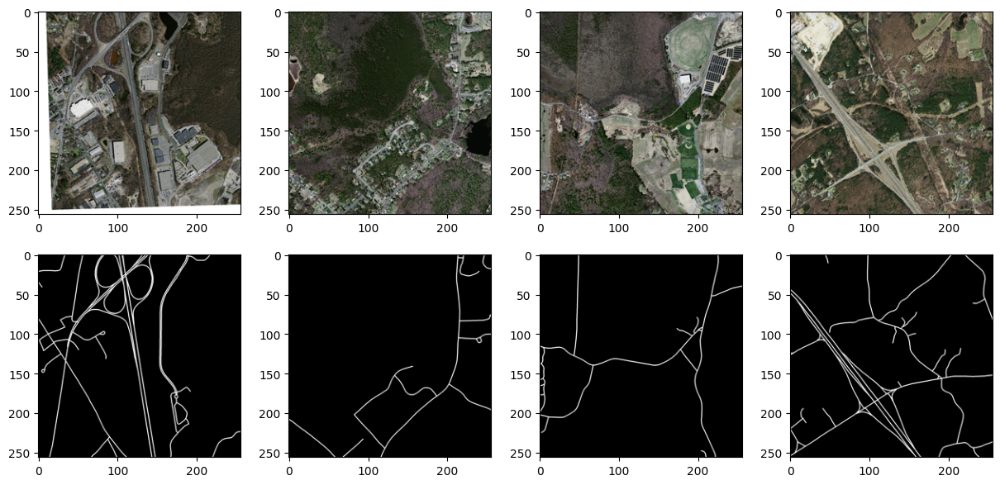

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 7))

# List of data and clim values
data = [(x_train, 1.0), (y_train, 0.7)]

# Plot images
for i, (data_set, clim) in enumerate(data):
    for j in range(4):
        ax = axes[i, j]
        imgplot = ax.imshow(read_and_rgb(data_set[j]))
        imgplot.set_clim(0.0, clim)

plt.show()

## Create the Model (Skip if using a pre-trained model)

In [ ]:
# Define the model
def model():
    inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name="input_image")

    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.75)
    skip_connection_list = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output

    fil = [48, 64, 96, 128]
    xt = encoder_output
    for i in range(1, len(skip_connection_list)+1, 1):
        xt_skip = encoder.get_layer(skip_connection_list[-i]).output
        xt = UpSampling2D((2, 2))(xt)
        xt = Concatenate()([xt, xt_skip])

        xt = Conv2D(fil[-i], (3, 3), padding="same")(xt)
        xt = BatchNormalization()(xt)
        xt = Activation("relu")(xt)

        xt = Conv2D(fil[-i], (3, 3), padding="same")(xt)
        xt = BatchNormalization()(xt)
        xt = Activation("relu")(xt)

    xt = Conv2D(1, (1, 1), padding="same")(xt)
    xt = Activation("sigmoid")(xt)

    model = Model(inputs, xt)
    return model

In [ ]:
# Create model
model = model()
model.summary()

5903360/5903360 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 128, 128, 24  648         ['input_image[0][0]']            
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 128, 128, 24  96          ['Conv1[0][0]']                  
                               

In [ ]:
# Number of layers
len(model.layers)

153

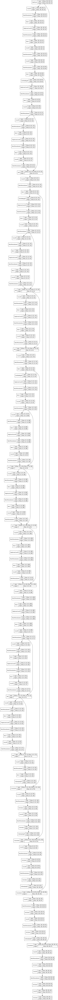

In [ ]:
# Plot the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=False, rankdir='TB')

## Only run this bock for loading a pre-trained model
The next but one code block will need to be executed before loading a model to load the dice_coef & dice_loss

In [ ]:
# Load pre-trained model
model = load_model('/content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/MobileUnet_with_weight_alpha075_150_epochs_lr5e-4.h5',custom_objects={'dice_loss': dice_loss,'dice_coef':dice_coef})
model.summary()

##  Define Metrics Hyperparameters and Compile model

In [ ]:
# Define dice coefficient & dice loss
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [ ]:
train_data = tf_dataset(x_train, y_train, batch=BATCH)
valid_data = tf_dataset(x_val, y_val, batch=BATCH)

In [ ]:
# Compile model
opt = tf.keras.optimizers.Nadam(LR) # Optimizer
metrics = [dice_coef, Recall(), Precision()]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)

In [ ]:
# Save best model
path_model = os.path.join('/content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/')
# pathlib.Path(path_model).mkdir(parents=True, exist_ok=True) # Create this dir if it doesnt exist

# The model that performs better than the last best accuracy will be saved in this path
mc = ModelCheckpoint(os.path.join(path_model,'MobileUNetW_alpha140_150_epochs_lr5e-4.h5'), monitor='val_dice_coef', mode='max', verbose=1, save_best_only=True)

In [ ]:
# Define callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=20),
    EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=False),
    mc
]

In [ ]:
train_steps = len(x_train)//BATCH
valid_steps = len(x_val)//BATCH

if len(x_train) % BATCH != 0:
    train_steps += 1
if len(x_val) % BATCH != 0:
    valid_steps += 1



In [ ]:
# function to plot the training metrics
def plot_nn_training(history):

    '''Given model training history, plots validation accuracy and loss'''

    # plot history for dice_coef
    plt.plot(history.history['dice_coef'])
    plt.plot(history.history['val_dice_coef'])
    plt.title('model dice coefficient')
    plt.ylabel('dice coefficient')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

    # plot history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

     # plot history for recall
    plt.plot(history.history['recall'])
    plt.plot(history.history['val_recall'])
    plt.title('model recall')
    plt.ylabel('recall')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

     # plot history for precision
    plt.plot(history.history['precision'])
    plt.plot(history.history['val_precision'])
    plt.title('model precision')
    plt.ylabel('precision')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

## Fit the Model

In [ ]:
results = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks
)

Epoch 1/150
30/30 [==============================] - ETA: 0s - loss: 0.8047 - dice_coef: 0.1965 - recall: 0.7302 - precision: 0.2704 
Epoch 1: val_dice_coef improved from -inf to 0.14748, saving model to /content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/best_model.h5
30/30 [==============================] - 423s 12s/step - loss: 0.8047 - dice_coef: 0.1965 - recall: 0.7302 - precision: 0.2704 - val_loss: 0.8527 - val_dice_coef: 0.1475 - val_recall: 0.6115 - val_precision: 0.4051 - lr: 5.0000e-04
Epoch 2/150
30/30 [==============================] - ETA: 0s - loss: 0.7243 - dice_coef: 0.2768 - recall: 0.6771 - precision: 0.5016
Epoch 2: val_dice_coef did not improve from 0.14748
30/30 [==============================] - 24s 790ms/step - loss: 0.7243 - dice_coef: 0.2768 - recall: 0.6771 - precision: 0.5016 - val_loss: 0.8644 - val_dice_coef: 0.1360 - val_recall: 0.2680 - val_precision: 0.6266 - lr: 5.0000e-04
Epoch 3/150
30/30 [==============================] - ETA: 0s - loss: 0.

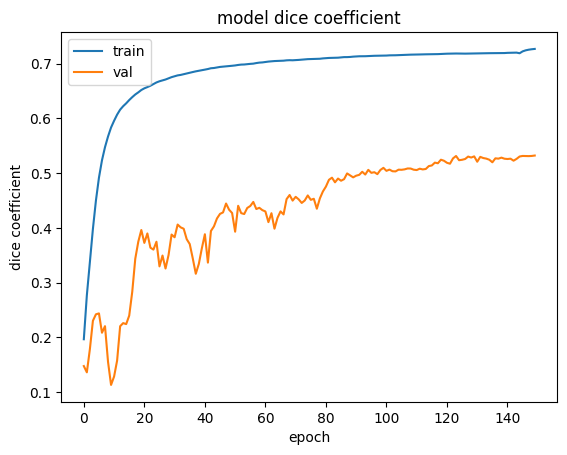

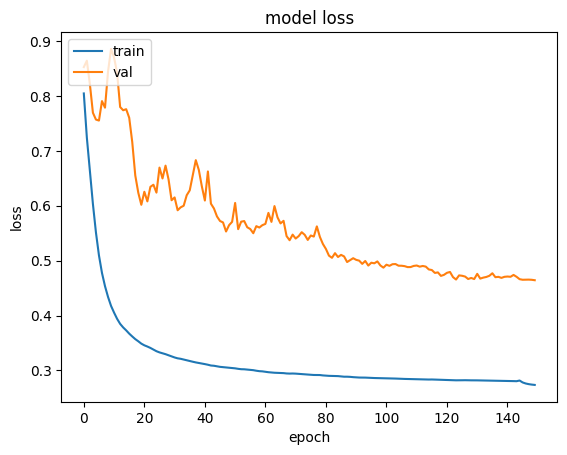

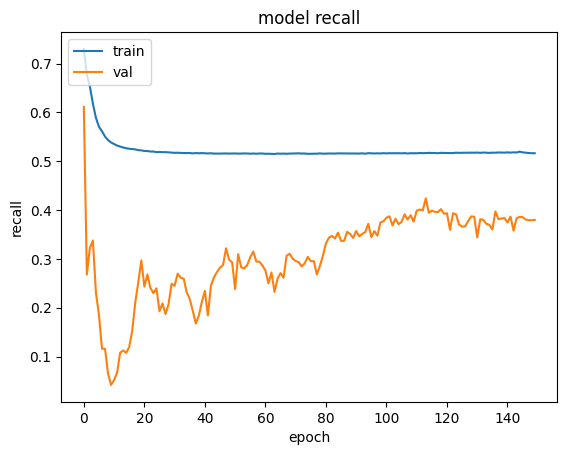

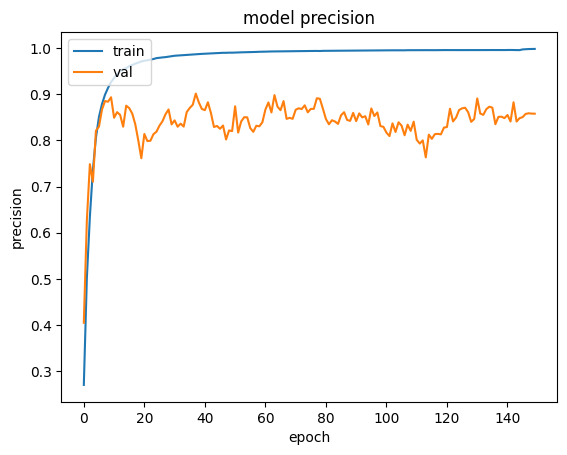

In [ ]:
#plot performance by epoch
plot_nn_training(results)

## Save model and weights for future use

In [ ]:
model.save_weights("/content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/MobileUNetW_alpha140_150_epochs_lr5e-4.h5")

model.save("/content/drive/My Drive/Datasets/Massachusetts_Roads_png_256/MobileUnet_with_weight_alpha140_150_epochs_lr5e-4.h5")

## Test performance on Massachusetts test data



In [ ]:
test_data = tf_dataset(x_test, y_test, batch=BATCH)

test_steps = (len(x_test)//BATCH)
if len(x_test) % BATCH != 0:
    test_steps += 1

model.evaluate(test_data, steps=test_steps)

4/4 [==============================] - 141s 19s/step - loss: 0.5103 - dice_coef: 0.4901 - recall: 0.4110 - precision: 0.8190


[0.5102664232254028,
 0.4901089668273926,
 0.4110146164894104,
 0.8190118074417114]

## Visualize Massachusetts Results

In [ ]:
def read_img(path):
    xt = cv2.imread(path, cv2.IMREAD_COLOR)
    xt = cv2.cvtColor(xt, cv2.COLOR_BGR2RGB)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = xt/255.0
    return xt

def read_mask(path):
    xt = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = np.expand_dims(xt, axis=-1)
    xt = xt/255.0
    return xt

def mask_parse(mask):
    mask = np.squeeze(mask)
    mask = [mask, mask, mask]
    mask = np.transpose(mask, (1, 2, 0))
    return mask

1/1 [==============================] - 0s 25ms/step


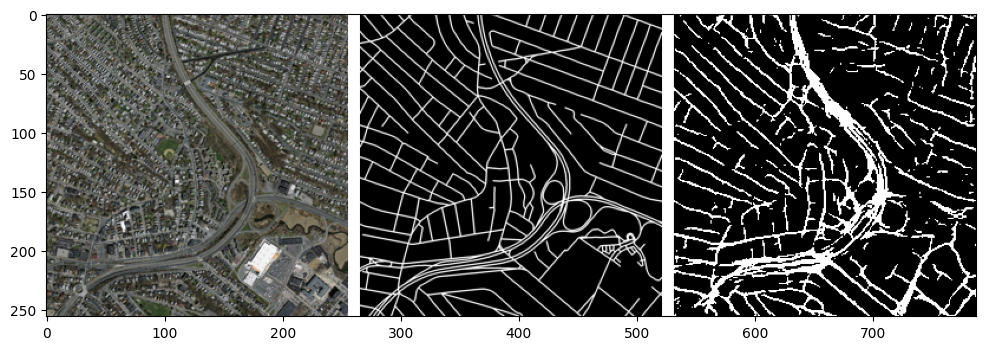

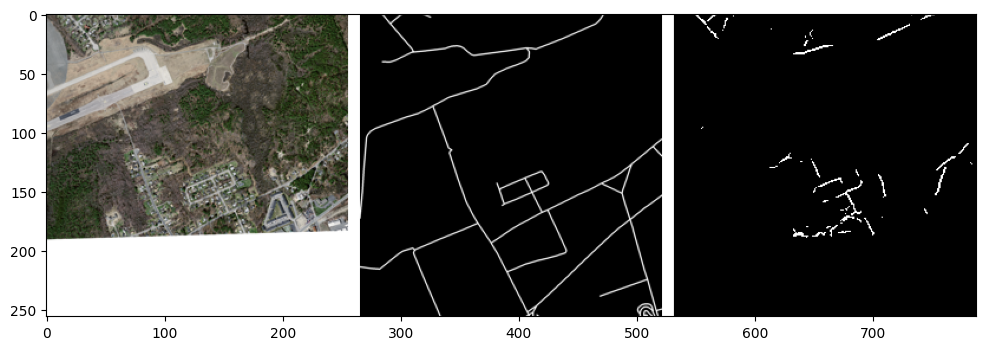

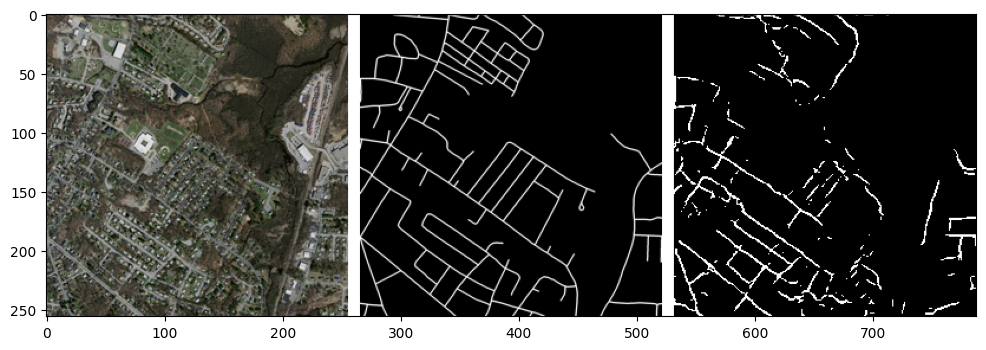

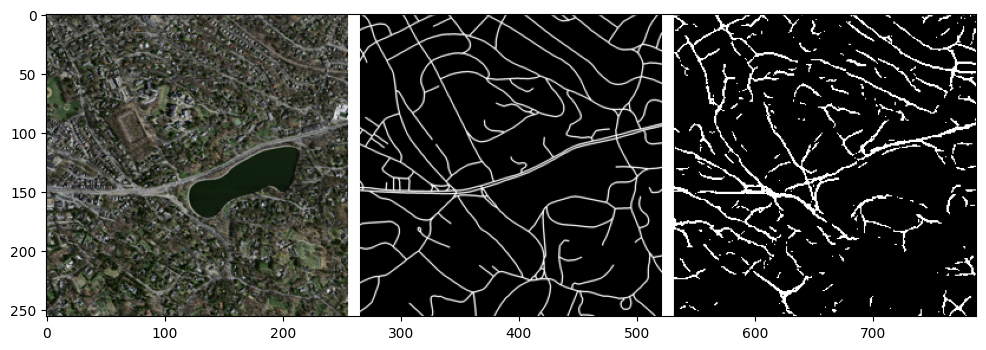

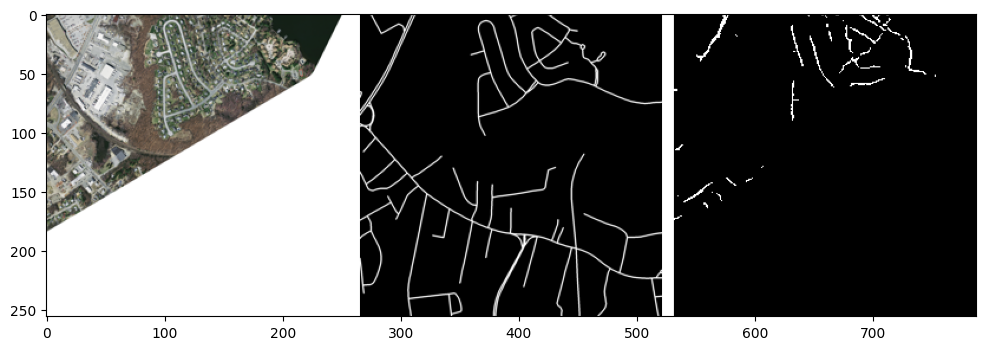

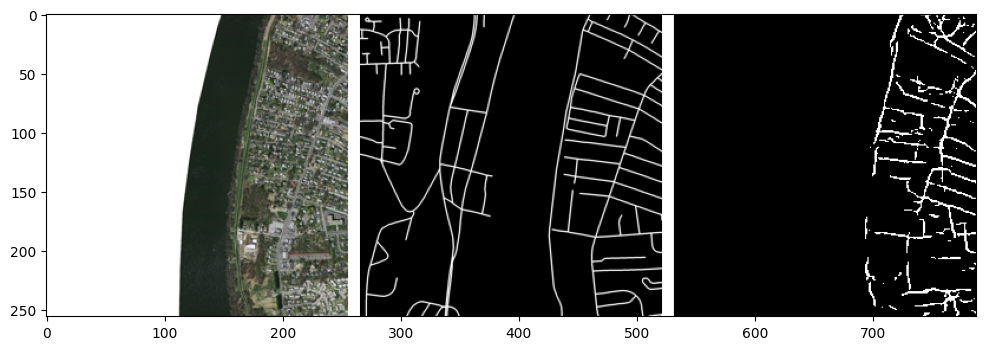

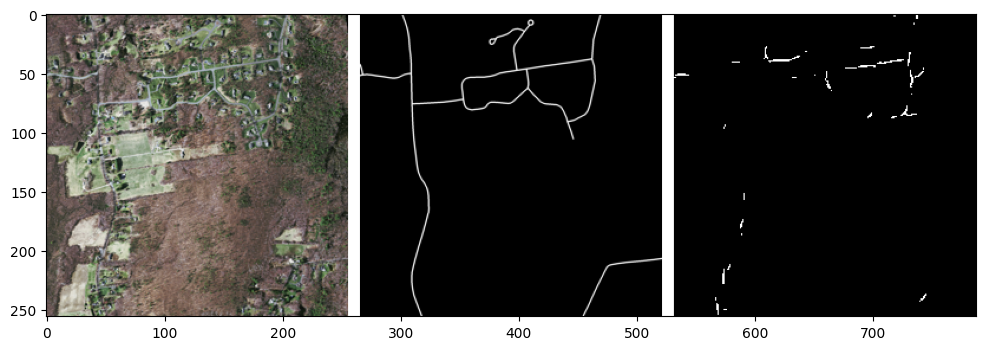

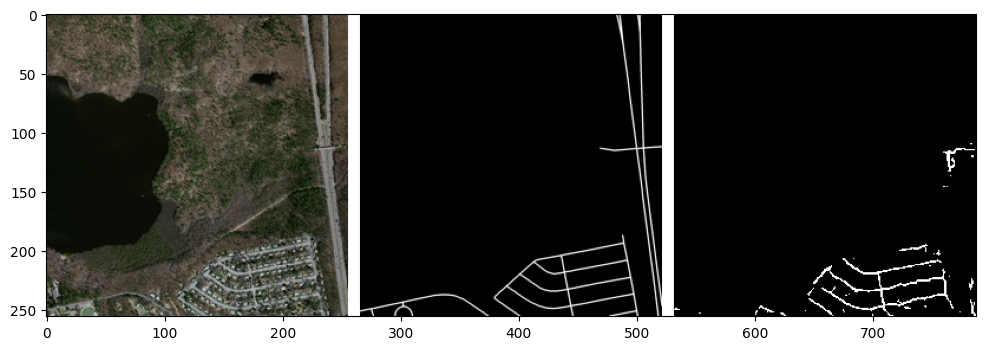

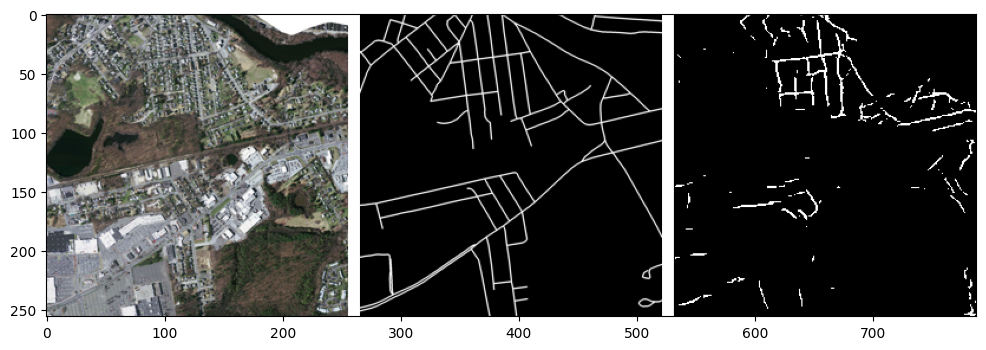

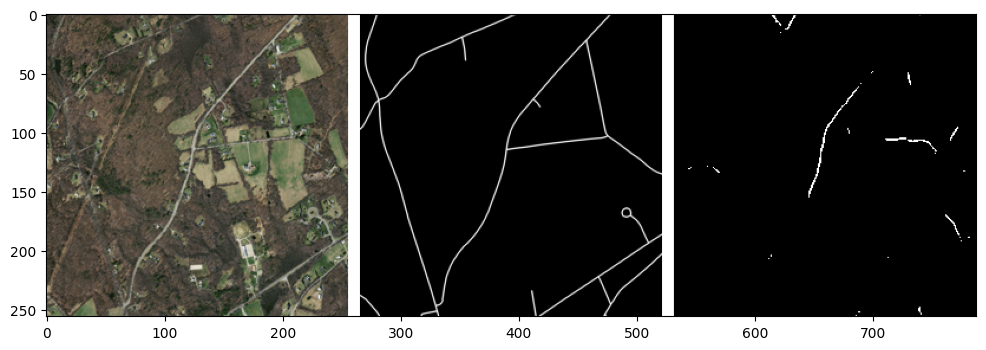

In [ ]:
for i, (a, b) in enumerate(zip(x_test[10:20], y_test[10:20])):
    a = read_img(a)
    b = read_mask(b)
    y_pred = model.predict(np.expand_dims(a, axis=0))[0] > 0.5
    h, w, _ = a.shape
    white_line = np.ones((h, 10, 3))

    all_images = [
        a, white_line,
        mask_parse(b), white_line,
        mask_parse(y_pred)
    ]
    image = np.concatenate(all_images, axis=1)

    fig = plt.figure(figsize=(12, 12))
    x = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image)

## Test performance on Cologne test data


In [ ]:
testing = sorted(glob(os.path.join("/content/drive/My Drive/Datasets/Cologne_Roads/", "test/*")))
testing_masks = sorted(glob(os.path.join("/content/drive/My Drive/Datasets/Cologne_Roads/", "test_labels/*")))

print("Testing data: ", len(testing))
print("Masks data: ", len(testing_masks))

Testing data:  10
Masks data:  10


In [ ]:
# Load all the images and masks
x_test_cgn = testing
y_test_cgn = testing_masks

print("Testing data: ", len(x_test_cgn))

Testing data:  10


In [ ]:
# Read, resize and  normalize an aerial image
def read_img(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_COLOR)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    return tmp

# Read, resize, normalize and add dimension to an aerial image mask
def read_mask(path):
    path = path.decode()
    tmp = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    tmp = cv2.resize(tmp, (IMG_SIZE, IMG_SIZE))
    tmp = tmp/255.0
    tmp = np.expand_dims(tmp, axis=-1)
    return tmp

def tf_parse(a, b):
    def _parse(a, b):
        a = read_img(a)
        b = read_mask(b)
        return a, b

    a, b = tf.numpy_function(_parse, [a, b], [tf.float64, tf.float64])
    a.set_shape([IMG_SIZE, IMG_SIZE, 3])
    b.set_shape([IMG_SIZE, IMG_SIZE, 1])
    return a, b

def tf_dataset(a, b, batch=32):
    data = tf.data.Dataset.from_tensor_slices((a, b))
    data = data.map(tf_parse)
    data = data.batch(batch)
    data = data.repeat()
    return data

In [ ]:
test_data_cgn = tf_dataset(x_test_cgn, y_test_cgn)

test_steps = (len(x_test_cgn) // BATCH)
if len(x_test_cgn) % BATCH != 0:
    test_steps += 1

model.evaluate(test_data_cgn, steps=test_steps)

1/1 [==============================] - 33s 33s/step - loss: 0.6891 - dice_coef: 0.3109 - recall: 0.3123 - precision: 0.3842


[0.6890741586685181,
 0.31092584133148193,
 0.3122921884059906,
 0.38421598076820374]

## Visualize Cologne Results

In [ ]:
def read_img(path):
    xt = cv2.imread(path, cv2.IMREAD_COLOR)
    xt = cv2.cvtColor(xt, cv2.COLOR_BGR2RGB)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = xt/255.0
    return xt

def read_mask(path):
    xt = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    xt = cv2.resize(xt, (IMG_SIZE, IMG_SIZE))
    xt = np.expand_dims(xt, axis=-1)
    xt = xt/255.0
    return xt

def mask_parse(mask):
    mask = np.squeeze(mask)
    mask = [mask, mask, mask]
    mask = np.transpose(mask, (1, 2, 0))
    return mask

1/1 [==============================] - 0s 30ms/step


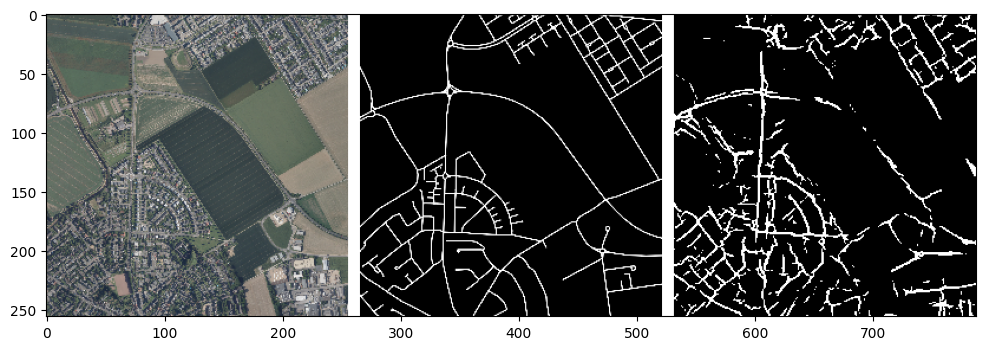

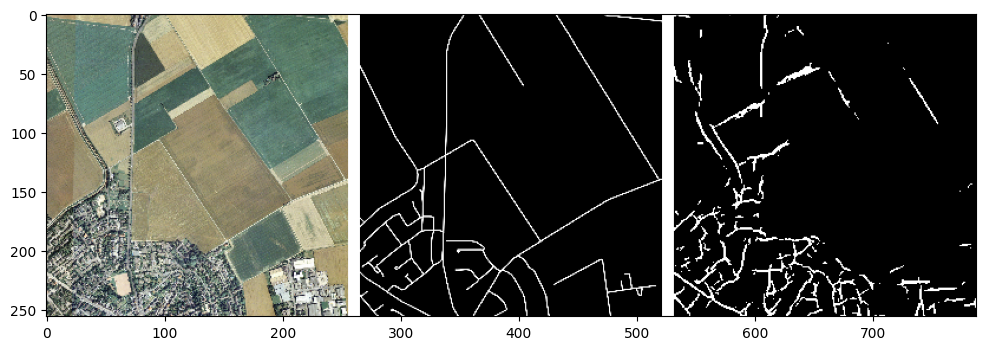

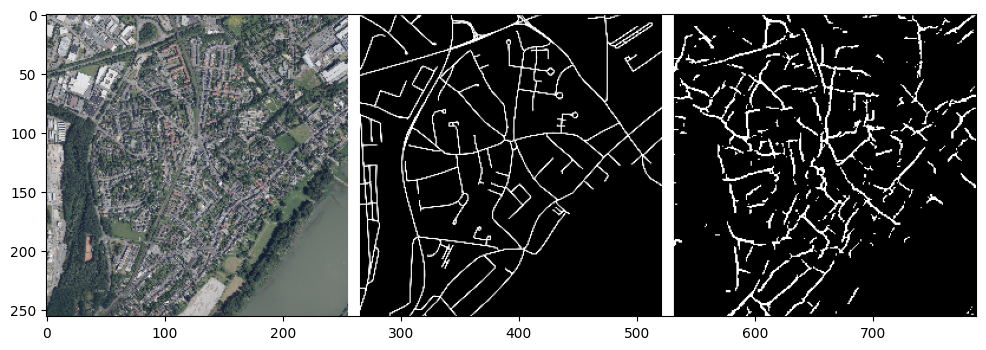

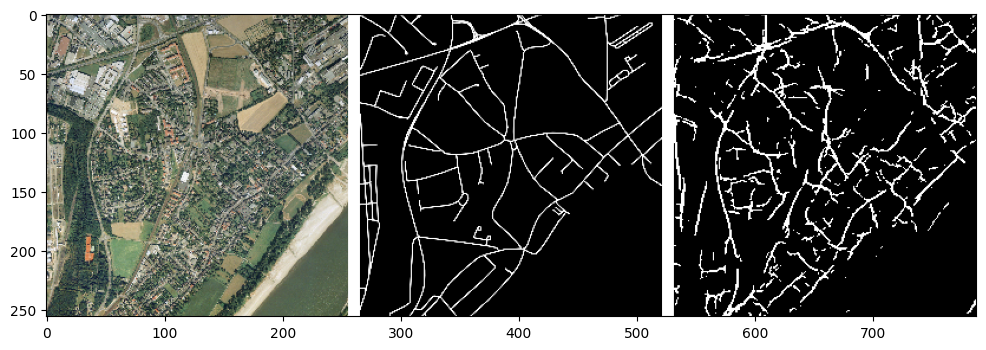

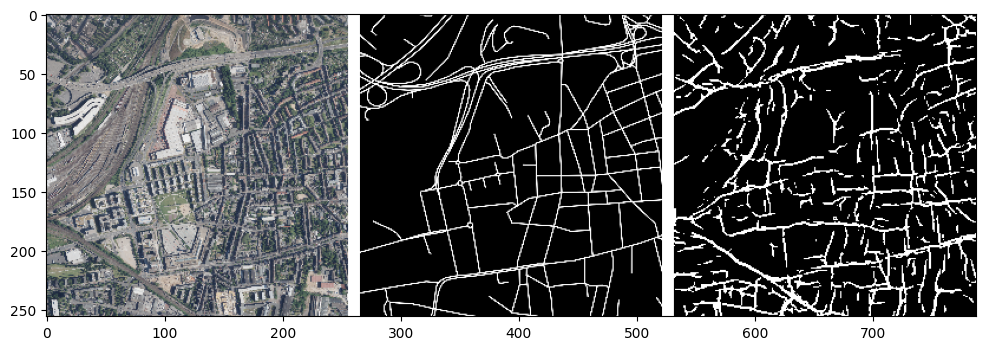

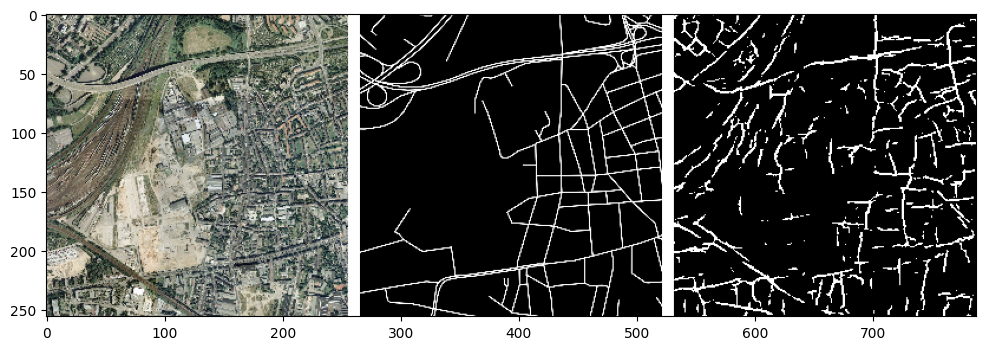

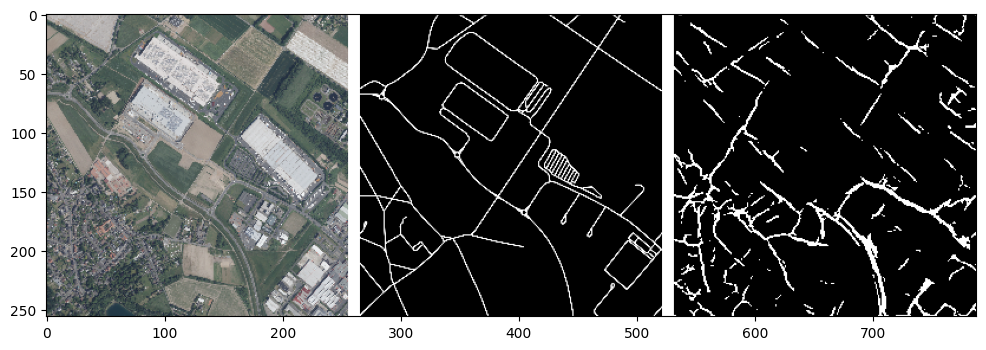

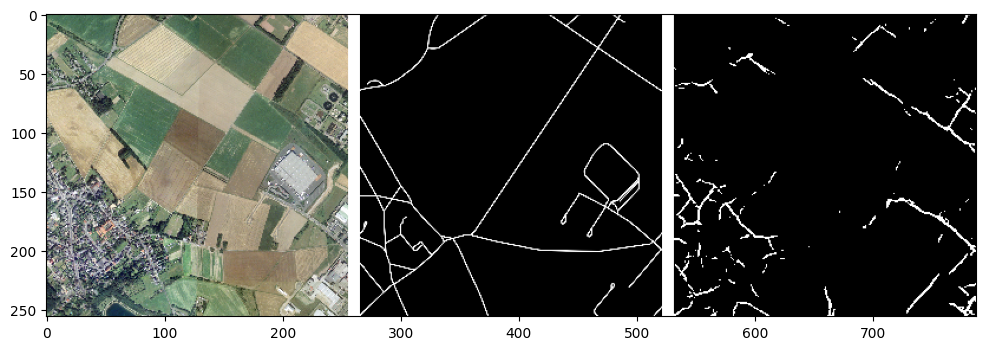

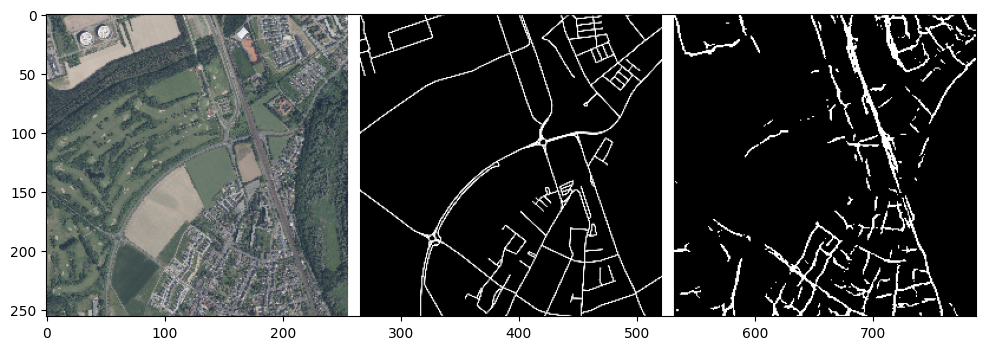

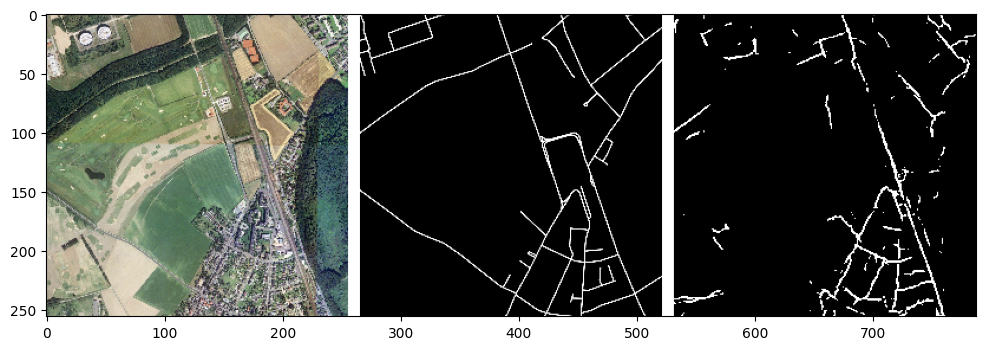

In [ ]:
for i, (a, b) in enumerate(zip(testing[0:10], testing_masks[0:10])):
    a = read_img(a)
    b = read_mask(b)
    y_pred = model.predict(np.expand_dims(a, axis=0))[0] > 0.5
    h, w, _ = a.shape
    white_line = np.ones((h, 10, 3))

    all_images = [
        a, white_line,
        mask_parse(b), white_line,
        mask_parse(y_pred)
    ]
    image = np.concatenate(all_images, axis=1)

    fig = plt.figure(figsize=(12, 12))
    x = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image)

# Change Detection

By directly comparing the images to each other side-by-side, changes in the road network of each area can be visually identified. To more easily be able to identify changes, an interactive slider tool has been developed to display the results in Cologne and can be used at the following web address: https://adiandawuda.com/rchan